<a href="https://colab.research.google.com/github/eduardax/TuneTransfer/blob/master/DM_Atletas_Feminino_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Importando o Pandas.
!pip install pandas-profiling
import pandas as pd
from pandas_profiling import ProfileReport

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Montando a partição do Google Drive para acessar os arquivos
from google.colab import drive
drive.mount('/content/drive', True)

Mounted at /content/drive


In [ ]:
# Lendo uma base de dados
arquivo = '/content/drive/MyDrive/Colab Notebooks/athlete_events.csv'
dataset = pd.read_csv(arquivo, sep=',', header=0)

print('Base carregada com sucesso \o/')

Base carregada com sucesso \o/


In [ ]:
# Imprimindo o tipo da variável dataset
# Dataframe é um estrutura de dados onde linhas podem ter colunas de diferentes tipos.
type(dataset)

pandas.core.frame.DataFrame

In [ ]:
# Método count() retorna a quantidade de linhas de todas as colunas.
dataset.count()

ID        271116
Name      271116
Sex       271116
Age       261642
Height    210945
Weight    208241
Team      271116
NOC       271116
Games     271116
Year      271116
Season    271116
City      271116
Sport     271116
Event     271116
Medal      39783
dtype: int64

**Data Dictionary - Jogos Olímpcios:**
* ID = ID do atleta
* Name = Nome do atleta
* Sex = Gênero do atleta (0 -> F | 1 -> M)
* Age = Idade do atleta
* Height = Altura do atleta
* Weight = Peso do atleta
* Team = País que representa
* Year = Ano do evento
* Season = Temporada do evento olímpico
* City = Cidade que o evento aconteceu
* Sport = Esporte praticado pelo atleta
* Event = Evento olímpico
* Medal = Medalha que o atleta recebeu



Removendo colunas indesejadas

In [ ]:
# Lista de colunas indesejadas que não serão úteis para a classificação
colunas_indesejadas = ['ID', 'Name', 'Team', 'NOC', 'Games', 'Year', 'Season', 'City','Event']
print(f'Removendo as colunas indesejadas: {colunas_indesejadas}')

print(f'Dataset antes da remoção das colunas: {dataset.shape[0]} linhas e {dataset.shape[1]} colunas')

# Removendo as colunas indesejadas.
# O parâmetro 'labels' espera receber uma lista com os nomes das colunas que devem ser removidas (dropadas).
# O parâmetro 'axis' espera receber 0 (ou 'index') para remover linhas ou 1 (ou 'columns') para remover colunas.
# No nosso caso, iremos remover as colunas (axis=1 ou axis='columns')
dataset_novo = dataset

dataset = dataset.drop(labels=colunas_indesejadas, axis=1)

print(f'Dataset após a remoção das colunas: {dataset.shape[0]} linhas e {dataset.shape[1]} colunas\n')
dataset.head()

Removendo as colunas indesejadas: ['ID', 'Name', 'Team', 'NOC', 'Games', 'Year', 'Season', 'City', 'Event']
Dataset antes da remoção das colunas: 271116 linhas e 15 colunas
Dataset após a remoção das colunas: 271116 linhas e 6 colunas



,Sex,Age,Height,Weight,Sport,Medal
0,M,24.0,180.0,80.0,Basketball,NaN
1,M,23.0,170.0,60.0,Judo,NaN
2,M,24.0,NaN,NaN,Football,NaN
3,M,34.0,NaN,NaN,Tug-Of-War,Gold
4,F,21.0,185.0,82.0,Speed Skating,NaN


Removendo linhas com valores vazios (NaN)

In [ ]:
print('Número de linhas vazias para cada coluna (NaN):')
dataset.isna().sum()

Número de linhas vazias para cada coluna (NaN):


Sex            0
Age         9474
Height     60171
Weight     62875
Sport          0
Medal     231333
dtype: int64

## Exercício
Baseado na coluna "Sex" alterne o pré-processo para preencher a coluna "Age" quando for vazia (NaN) com a média da idade pelo sexo.

In [ ]:
print("Total de mulheres: ",(dataset['Sex']=="F").sum())
print("Total de homens: ",(dataset['Sex']=="M").sum())

Total de mulheres:  74522
Total de homens:  196594


In [ ]:
# Usando o 'loc' para localizar as linhas através de um filtro,
# e selecionar uma coluna específica da coluna e atribuir um novo valor para ela.
dataset.loc[dataset['Sex'] == 'F', 'Sex'] = 0
dataset.loc[dataset['Sex'] == 'M', 'Sex'] = 1

#Verificando o index para a coluna do Sex = F
sex_f = dataset[dataset["Sex"]==0].index
#Verificando o index para a coluna do Sex = M
sex_m = dataset[dataset["Sex"]==1].index

#Usando 'drop' para excluir linhas no Sex = M e 'setando' o dataset feminino
sex_folks_f = dataset.drop(sex_m)

print("The female dataset is:")
print(sex_folks_f.head())

dataset_F = sex_folks_f


The female dataset is:
  Sex   Age  Height  Weight          Sport Medal
4   0  21.0   185.0    82.0  Speed Skating   NaN
5   0  21.0   185.0    82.0  Speed Skating   NaN
6   0  25.0   185.0    82.0  Speed Skating   NaN
7   0  25.0   185.0    82.0  Speed Skating   NaN
8   0  27.0   185.0    82.0  Speed Skating   NaN


In [ ]:
#Tirando a média da idade do sexo Feminino
mean_age_f = dataset_F['Age'].mean()
print("Age female:", mean_age_f)


Age female: 23.732880779508218


In [ ]:
#Substituindo os NaN pela média da idade do sexo Feminino
dataset_F['Age'].fillna(value=dataset_F['Age'].mean(), inplace=True)

dataset_F.head()


,Sex,Age,Height,Weight,Sport,Medal
4,0,21.0,185.0,82.0,Speed Skating,NaN
5,0,21.0,185.0,82.0,Speed Skating,NaN
6,0,25.0,185.0,82.0,Speed Skating,NaN
7,0,25.0,185.0,82.0,Speed Skating,NaN
8,0,27.0,185.0,82.0,Speed Skating,NaN


In [ ]:
#Verificando se coluna Age contém campos nulos
dataset_F.isna().sum()

Sex           0
Age           0
Height     7144
Weight     7751
Sport         0
Medal     63269
dtype: int64

In [ ]:
#Usando 'drop' para excluir as colunas 'Height' e 'Weight'
dataset_F = dataset_F.dropna(subset=['Height', 'Weight'])

In [ ]:
#Substituindo na coluna 'Medal' os valores NaN por 0 (sem medalhas)
values = {"Medal": 0}
dataset_F = dataset_F.fillna(value=values)

In [ ]:
#Dataframe sem a coluna 'Sex', pois foi separado em 2-> Female
dataset_Female = dataset_F.drop(labels='Sex', axis=1)

In [ ]:
# FEMALE
# Usando o 'loc' para localizar as linhas através de um filtro, e selecionar uma coluna específica da coluna e atribuir um novo valor para ela.
# Modificando as medalhas "Gold, Silver, Bronze" por 1
dataset_Female.loc[dataset_Female['Medal'] == 'Gold', 'Medal'] = 1
dataset_Female.loc[dataset_Female['Medal'] == 'Silver', 'Medal'] = 1
dataset_Female.loc[dataset_Female['Medal'] == 'Bronze', 'Medal'] = 1

In [ ]:
# FEMALE
# Verificando quanto se repete cada valor da coluna 'Medal'
dataset_Female['Medal'].value_counts()

0    56379
1    10350
Name: Medal, dtype: int64

In [ ]:
# FEMALE
# Verificando quais valores tem na coluna 'Sport' e quanto se repete
dataset_Female['Sport'].value_counts()

Athletics                    10992
Swimming                      8460
Gymnastics                    7577
Cross Country Skiing          3086
Alpine Skiing                 2604
Rowing                        2123
Speed Skating                 1941
Biathlon                      1807
Fencing                       1774
Shooting                      1665
Volleyball                    1495
Hockey                        1390
Cycling                       1338
Handball                      1283
Canoeing                      1280
Basketball                    1207
Equestrianism                 1153
Judo                           997
Football                       984
Diving                         968
Tennis                         964
Archery                        884
Sailing                        871
Table Tennis                   862
Synchronized Swimming          849
Figure Skating                 770
Ice Hockey                     754
Short Track Speed Skating      739
Badminton           

In [ ]:
# FEMALE
# Selecionado apenas as linhas com o valor 'Athletics' da coluna 'Sport' e colocando em novo dataframe
dataset_Female_Athletics = dataset_Female.loc[dataset_Female['Sport'] == 'Athletics']

dataset_Female_Athletics

,Age,Height,Weight,Sport,Medal
135,24.0,168.0,65.0,Athletics,0
136,28.0,168.0,65.0,Athletics,0
163,22.0,179.0,80.0,Athletics,1
164,26.0,179.0,80.0,Athletics,0
193,25.0,168.0,105.0,Athletics,0
...,...,...,...,...,...
271078,25.0,168.0,80.0,Athletics,1
271079,29.0,168.0,80.0,Athletics,0
271080,33.0,168.0,80.0,Athletics,1
271102,19.0,171.0,64.0,Athletics,1


In [ ]:
#Usando 'drop' para excluir a coluna 'Sport'
dataset_Female_Athletics = dataset_Female_Athletics.drop(columns=['Sport'])

dataset_Female_Athletics

,Age,Height,Weight,Medal
135,24.0,168.0,65.0,0
136,28.0,168.0,65.0,0
163,22.0,179.0,80.0,1
164,26.0,179.0,80.0,0
193,25.0,168.0,105.0,0
...,...,...,...,...
271078,25.0,168.0,80.0,1
271079,29.0,168.0,80.0,0
271080,33.0,168.0,80.0,1
271102,19.0,171.0,64.0,1


In [ ]:
dataset_Female_Athletics['Medal'].value_counts()

0    9753
1    1239
Name: Medal, dtype: int64

In [ ]:
(dataset_Female_Athletics[['Medal']] == 0).sample(1239)

,Medal
13152,True
217456,True
142274,True
49293,True
62192,True
...,...
85678,True
187956,True
257566,True
176018,True


In [ ]:
#Importando matplotlib
import matplotlib
%matplotlib inline

Random under-sampling:
0    1239
1    1239
Name: Medal, dtype: int64


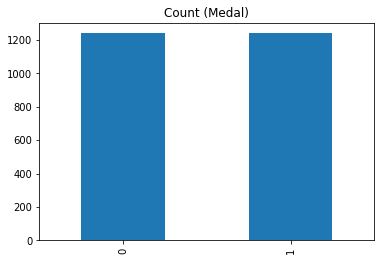

In [ ]:
# FEMALE
# Class count
count_class_0, count_class_1 = dataset_Female_Athletics.Medal.value_counts()

# Divide by class
df_class_0 = dataset_Female_Athletics[dataset_Female_Athletics['Medal'] == 0]
df_class_1 = dataset_Female_Athletics[dataset_Female_Athletics['Medal'] == 1]

#UNDER SAMPLING
df_class_0_under = df_class_0.sample(count_class_1)
df_test_under = pd.concat([df_class_0_under, df_class_1], axis=0)

print('Random under-sampling:')
print(df_test_under.Medal.value_counts())

df_test_under.Medal.value_counts().plot(kind='bar', title='Count (Medal)');

In [ ]:
dataset_Female_Athletics = df_test_under

# Aplicação dos classificadores

Gerando as bases de treinamento e testes

In [ ]:
# Importando o MatplotLib para auxiliar dos plots
import matplotlib.pyplot as plt

# Importações para separar o dataset em treinamento e teste
import numpy as np
from sklearn.model_selection import train_test_split

# Importações para exibir as métricas dos modelos
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import plot_confusion_matrix

# Importação para realizar o plot das árvores
from sklearn import tree

In [ ]:
#FEMALE

# Convertendo o dataset em arrays Numpy
# X_female conterá todas as colunas, exceto a coluna alvo (Medal)
X_female = np.array(dataset_Female_Athletics.drop(labels='Medal', axis=1))
# y_female conterá apenas a coluna alvo (Medal)
y_female = np.array(dataset_Female_Athletics['Medal'])

print('Amostra de 3 linhas:')
print(f'X = {X_female[0:3]}')
print(f'y = {y_female[0:3]}\n')

# Fazendo a separação da base em treinamento e teste
X_train_female, X_test_female, y_train_female, y_test_female = train_test_split(X_female, y_female, test_size=0.3, random_state=0)

print(f'Dataset de treinamento: {len(X_train_female)} linhas')
print(f'Dataset de teste: {len(X_test_female)} linhas')

Amostra de 3 linhas:
X = [[ 23. 183.  55.]
 [ 30. 168.  56.]
 [ 20. 168.  48.]]
y = [0 0 0]

Dataset de treinamento: 1734 linhas
Dataset de teste: 744 linhas


In [ ]:
y_train_female = y_train_female.astype(int)

In [ ]:
y_train_female

array([0, 1, 0, ..., 0, 0, 1])

In [ ]:
X_train_female = X_train_female.astype(int)

In [ ]:
X_train_female

array([[ 38, 170,  58],
       [ 27, 176,  63],
       [ 28, 172,  68],
       ...,
       [ 23, 156,  54],
       [ 20, 166,  56],
       [ 28, 175,  85]])

#DecisionTreeClassifier

In [ ]:
# Importando o classificador e gridsearch
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

## Grid Search - Decision

In [ ]:
#Setando os hiperparâmetros para rodar na grid
hyperparmameters_dt = {
    "max_depth" : [2,4,6,8,10,12],
    "criterion": ["gini", "entropy"],
    "splitter": ["best", "random"]
}


grid_search_dr = GridSearchCV(estimator = DecisionTreeClassifier(),
                                param_grid = hyperparmameters_dt,
                                cv = 4, n_jobs = -1, verbose = 0)

grid_search_dr.fit(X_train_female, y_train_female)

Y_female_dr = grid_search_dr.predict(X_test_female)

In [ ]:
print('Grid Search selected parameters: {}'.format(grid_search_dr.best_params_))

Grid Search selected parameters: {'criterion': 'entropy', 'max_depth': 2, 'splitter': 'best'}


### Treinando o modelo

In [ ]:
# FEMALE
# Criando uma instancia do classificador

# Declaração utilizando todos os parâmetros com valores padrões (default)
#clf_dt_female = DecisionTreeClassifier()

# Declaração passando todos os possíveis parâmetros
clf_dt_female = DecisionTreeClassifier(
    criterion='entropy', splitter='random', max_depth=8,
    min_samples_split=4, min_samples_leaf=2, min_weight_fraction_leaf=0.0,
    max_features=None, random_state=True, max_leaf_nodes=None,
    min_impurity_decrease=0.0, class_weight=None, ccp_alpha=0.0
)

# Realizar o treinamento do modelo utilizando as bases de treinamento
clf_dt_female.fit(X_train_female, y_train_female)

print('DecisionTreeClassifier treinado com sucesso')

print('Realizando a classificação');

# O método 'predict' fará a predição/classificação utilizando o modelo já treinado
# Para realizar a predição/classificação, passaremos a base de teste
y_pred_dt_female = clf_dt_female.predict(X_test_female)

y_test_female = y_test_female.astype(int)

print('Classificações realizadas com sucesso')

DecisionTreeClassifier treinado com sucesso
Realizando a classificação
Classificações realizadas com sucesso


(744,)
(744,)
Acurácia de teste: 0.5645161290322581

Relatório da classificação:
              precision    recall  f1-score   support

           0       0.58      0.53      0.55       377
           1       0.55      0.60      0.58       367

    accuracy                           0.56       744
   macro avg       0.57      0.56      0.56       744
weighted avg       0.57      0.56      0.56       744


Matriz de confusão:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


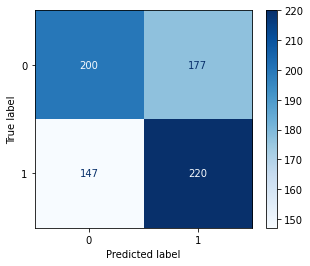

In [ ]:
print(y_pred_dt_female.shape)
print(y_test_female.shape)
print(f'Acurácia de teste: {accuracy_score(y_test_female, y_pred_dt_female)}\n')

print('Relatório da classificação:')
print(classification_report(y_test_female,y_pred_dt_female))

print('\nMatriz de confusão:')

plt.rcParams['figure.figsize'] = (5, 4)
plot_confusion_matrix(clf_dt_female, X_test_female, y_test_female, cmap='Blues')

### Plotando a árvore

In [ ]:
plt.rcParams['figure.figsize'] = (160, 70)
tree.plot_tree(
    clf_dt_female, # O modelo treinado
    fontsize=16, # Tamanho da fonte
    feature_names=dataset_Female_Athletics.drop(labels=['Medal'], axis=1).columns.to_list(), # Nomes das colunas (features) com exceção da coluna alvo
    class_names='Medal', # Possíveis valores para a coluna alvo
    filled=True, # Aplicar cores aos nós
)

# RandomForestClassifier

In [ ]:
# Importando o classificador
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

### Grid Search - Random

In [ ]:
#Setando os hiperparâmetros para rodar na grid
hyperparmameters_rf = {
    "n_estimators": [50,100,150,200],
    "criterion": ["gini", "entropy"],
    "max_features" : ["sqrt", "log2"]
}

grid_search_rf = GridSearchCV(estimator = RandomForestClassifier(),
                                param_grid = hyperparmameters_rf,
                                cv = 5, n_jobs = 1, verbose = 0)

grid_search_rf.fit(X_train_female, y_train_female)

Y_female_rf = grid_search_rf.predict(X_test_female)

In [ ]:
print('Grid Search selected parameters: {}'.format(grid_search_rf.best_params_))

Grid Search selected parameters: {'criterion': 'entropy', 'max_features': 'sqrt', 'n_estimators': 150}


### Treinando o modelo

In [ ]:
# Criando uma instancia do classificador

# Declaração utilizando todos os parâmetros com valores padrões (default)
# clf_rf_female = RandomForestClassifier()

# Declaração passando todos os possíveis parâmetros
clf_rf_female = RandomForestClassifier(
    n_estimators=50, criterion='entropy', max_depth=None, min_samples_split=2,
    min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='sqrt',
    max_leaf_nodes=None, min_impurity_decrease=0.0,
    bootstrap=True, oob_score=False, n_jobs=None, random_state=None,
    verbose=0, warm_start=False, class_weight=None, ccp_alpha=0.0, max_samples=None
)

# Realizar o treinamento do modelo utilizando as bases de treinamento
clf_rf_female.fit(X_train_female, y_train_female)

print('RandomForestClassifier treinado com sucesso')

print('Realizando a classificação');

# O método 'predict' fará a predição/classificação utilizando o modelo já treinado
# Para realizar a predição/classificação, passaremos a base de teste
y_pred_rf_female = clf_rf_female.predict(X_test_female)

print('Classificações realizadas com sucesso')

RandomForestClassifier treinado com sucesso
Realizando a classificação
Classificações realizadas com sucesso


## Imprimido resultados

(744,)
(744,)
Acurácia: 0.5577956989247311

Relatório da classificação:
              precision    recall  f1-score   support

           0       0.57      0.51      0.54       377
           1       0.55      0.60      0.57       367

    accuracy                           0.56       744
   macro avg       0.56      0.56      0.56       744
weighted avg       0.56      0.56      0.56       744


Matriz de confusão:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


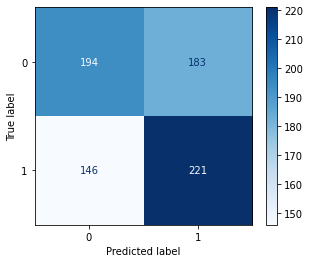

In [ ]:
print(y_pred_rf_female.shape)
print(y_test_female.shape)
print(f'Acurácia: {accuracy_score(y_test_female, y_pred_rf_female)}\n')

print('Relatório da classificação:')
print(classification_report(y_test_female,y_pred_rf_female))

print('\nMatriz de confusão:')

plt.rcParams['figure.figsize'] = (5, 4)
plot_confusion_matrix(clf_rf_female, X_test_female, y_test_female, cmap='Blues')

n_estimators=50, criterion='gini', max_features="log2" => Acurácia : 0.615 (61%)


### Plotando a árvore

[Text(0.45890143420791835, 0.9833333333333333, 'Weight <= 56.5\nentropy = 1.0\nsamples = 1088\nvalue = [881, 853]\nclass = M'),
 Text(0.11211556249277373, 0.95, 'Age <= 34.5\nentropy = 0.952\nsamples = 383\nvalue = [393, 232]\nclass = M'),
 Text(0.1100013626678559, 0.9166666666666666, 'Age <= 15.5\nentropy = 0.965\nsamples = 367\nvalue = [363, 232]\nclass = M'),
 Text(0.10788716284293808, 0.8833333333333333, 'entropy = 0.0\nsamples = 3\nvalue = [5, 0]\nclass = M'),
 Text(0.11211556249277373, 0.8833333333333333, 'Age <= 16.5\nentropy = 0.967\nsamples = 364\nvalue = [358, 232]\nclass = M'),
 Text(0.030127347505079036, 0.85, 'Height <= 161.5\nentropy = 0.544\nsamples = 3\nvalue = [1, 7]\nclass = e'),
 Text(0.028013147680161207, 0.8166666666666667, 'Weight <= 49.0\nentropy = 0.65\nsamples = 2\nvalue = [1, 5]\nclass = e'),
 Text(0.02589894785524338, 0.7833333333333333, 'entropy = 0.0\nsamples = 1\nvalue = [0, 5]\nclass = e'),
 Text(0.030127347505079036, 0.7833333333333333, 'entropy = 0.0\ns

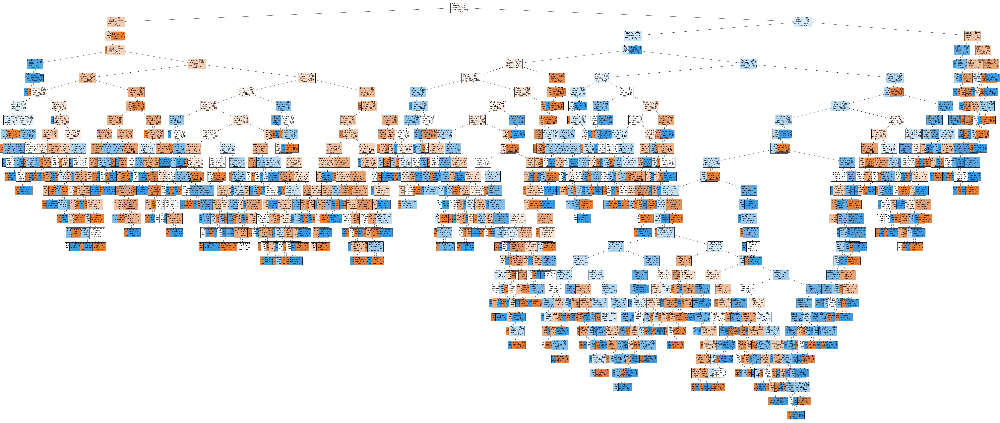

In [ ]:
plt.rcParams['figure.figsize'] = (160, 70)
tree.plot_tree(
    clf_rf_female.estimators_[45], # Imprimindo a 46ª árvore das 100 árvores geradas
    fontsize=16, # Tamanho da fonte
    feature_names=dataset_Female_Athletics.drop(labels=['Medal'], axis=1).columns.to_list(), # Nomes das colunas (features) com exceção da coluna alvo
    class_names='Medal', # Possíveis valores para a coluna alvo
    filled=True # Aplicar cores aos nós
)

In [ ]:
# plt.rcParams['figure.figsize'] = (30, 10)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(250, 70))
for index in range(0, 2):
  tree.plot_tree(
      clf_rf_female.estimators_[index], # Imprimindo o 1º stumb
      fontsize=16, # Tamanho da fonte
      feature_names=dataset_Female_Athletics.drop(labels=['Medal'], axis=1).columns.to_list(), # Nomes das colunas (features) com exceção da coluna alvo
      class_names='Medal', # Possíveis valores para a coluna alvo
      filled=True, # Aplicar cores aos nós
      ax = axes[index]
  )
  axes[index].set_title(f'Estimator: {index}', fontsize=11)

fig.savefig('rf_2trees.png')

# AdaBoostClassifier

In [ ]:
# Importando o classificador
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV

In [ ]:
#Setando os hiperparâmetros para rodar na grid
hyperparmameters_ab = {
    "learning_rate" : [.1,.2,.3,.4],
    "base_estimator__splitter" :   ["best", "random"],
    "n_estimators": [1, 2]
}

grid_search_ab = GridSearchCV(estimator = AdaBoostClassifier(
                                    base_estimator=clf_dt_female,
                                    algorithm='SAMME.R',
                                    random_state=1),
                                param_grid = hyperparmameters_ab,
                                scoring = 'roc_auc')

grid_search_ab.fit(X_train_female, y_train_female)

Y_female_ab = grid_search_ab.predict(X_test_female)


In [ ]:
print('Grid Search selected parameters: {}'.format(grid_search_ab.best_params_))

Grid Search selected parameters: {'base_estimator__splitter': 'random', 'learning_rate': 0.1, 'n_estimators': 2}


### Treinando modelo

In [ ]:
# Criando uma instancia do classificador

# Declaração utilizando todos os parâmetros com valores padrões (default)
# clf_ab = AdaBoostClassifier()

# Declaração passando todos os possíveis parâmetros
clf_ab_female = AdaBoostClassifier(
    base_estimator=None, n_estimators=10, learning_rate=.1,
    algorithm='SAMME.R', random_state=None
)
clf_ab_female.fit(X_train_female, y_train_female)

print('AdaBoostClassifier treinado com sucesso')

print('Realizando a classificação');

# O método 'predict' fará a predição/classificação utilizando o modelo já treinado
# Para realizar a predição/classificação, passaremos a base de teste
y_pred_ab_female = clf_ab_female.predict(X_test_female)

print('Classificações realizadas com sucesso')

AdaBoostClassifier treinado com sucesso
Realizando a classificação
Classificações realizadas com sucesso


### Imprimindo resultados

Acurácia: 0.5846774193548387

Relatório da classificação:
              precision    recall  f1-score   support

           0       0.61      0.49      0.54       377
           1       0.57      0.68      0.62       367

    accuracy                           0.58       744
   macro avg       0.59      0.59      0.58       744
weighted avg       0.59      0.58      0.58       744


Matriz de confusão:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


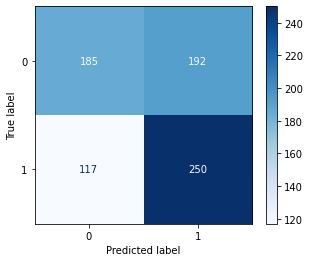

In [ ]:
print(f'Acurácia: {accuracy_score(y_test_female, y_pred_ab_female)}\n')

print('Relatório da classificação:')
print(classification_report(y_test_female,y_pred_ab_female))

print('\nMatriz de confusão:')

plt.rcParams['figure.figsize'] = (5, 4)
plot_confusion_matrix(clf_ab_female, X_test_female, y_test_female, cmap='Blues')

### Plotando a árvore (stumps)

[Text(0.5, 0.75, 'Weight <= 56.5\ngini = 0.5\nsamples = 1734\nvalue = [0.497, 0.503]\nclass = e'),
 Text(0.25, 0.25, 'gini = 0.475\nsamples = 589\nvalue = [0.208, 0.132]\nclass = M'),
 Text(0.75, 0.25, 'gini = 0.492\nsamples = 1145\nvalue = [0.29, 0.371]\nclass = e')]

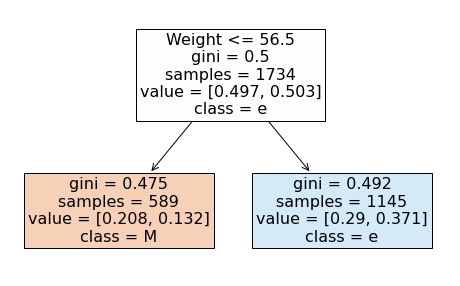

In [ ]:
plt.rcParams['figure.figsize'] = (8, 5)
tree.plot_tree(
    clf_ab_female.estimators_[0], # Imprimindo o 1º stumb
    fontsize=16, # Tamanho da fonte
    feature_names=dataset_Female_Athletics.drop(labels=['Medal'], axis=1).columns.to_list(), # Nomes das colunas (features) com exceção da coluna alvo
    class_names='Medal', # Possíveis valores para a coluna alvo
    filled=True # Aplicar cores aos nós
)

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(40, 5), dpi=900)
for index in range(0, 5):
  tree.plot_tree(
      clf_ab_female.estimators_[index], # Imprimindo o 1º stumb
      fontsize=16, # Tamanho da fonte
      feature_names=dataset_Female_Athletics.drop(labels=['Medal'], axis=1).columns.to_list(), # Nomes das colunas (features) com exceção da coluna alvo
      class_names='Medal', # Possíveis valores para a coluna alvo
      filled=True, # Aplicar cores aos nós
      ax = axes[index]
  )
  axes[index].set_title(f'Estimator: {index}', fontsize=11)

fig.savefig('ada_5trees.png')

# GradientBoostingClassifier

In [ ]:
# Importando o classificador
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV

### Grid Seatch - Gradient

In [ ]:
#Setando os hiperparâmetros para rodar na grid
hyperparmameters_gb = {
    "learning_rate": [ 0.1, 0.5, 1],
    "max_depth":[3,5,8],
    "max_features":["log2","sqrt"],
    #"criterion": ["friedman_mse",  "mae"],
    "n_estimators":[5,10,15]
}

grid_search_gb = GridSearchCV(GradientBoostingClassifier(),
                              param_grid = hyperparmameters_gb,
                              cv=10,
                              n_jobs= -1)

grid_search_gb.fit(X_train_female, y_train_female)

Y_female_gb = grid_search_gb.predict(X_test_female)

In [ ]:
print('Grid Search selected parameters: {}'.format(grid_search_gb.best_params_))

Grid Search selected parameters: {'learning_rate': 0.1, 'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 15}


### Treinando modelo

In [ ]:
# Criando uma instancia do classificador

# Declaração utilizando todos os parâmetros com valores padrões (default)
# clf_gb_female = GradientBoostingClassifier()

# Declaração passando todos os possíveis parâmetros
clf_gb_female = GradientBoostingClassifier(
    loss='deviance', learning_rate=0.1, n_estimators=10,
    #max_depth= '3',
    max_features= 'log2'

)
clf_gb_female.fit(X_train_female, y_train_female)

print('GradientBoostingClassifier treinado com sucesso')

print('Realizando a classificação');

# O método 'predict' fará a predição/classificação utilizando o modelo já treinado
# Para realizar a predição/classificação, passaremos a base de teste
y_pred_gb_female = clf_gb_female.predict(X_test_female)

print('Classificações realizadas com sucesso')

GradientBoostingClassifier treinado com sucesso
Realizando a classificação
Classificações realizadas com sucesso


### Imprimindo resultados

Acurácia: 0.5698924731182796

Relatório da classificação:
              precision    recall  f1-score   support

           0       0.59      0.50      0.54       377
           1       0.56      0.64      0.59       367

    accuracy                           0.57       744
   macro avg       0.57      0.57      0.57       744
weighted avg       0.57      0.57      0.57       744


Matriz de confusão:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


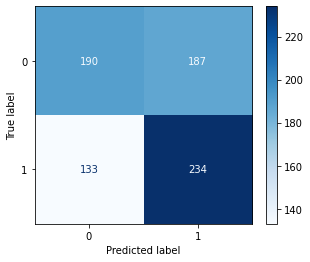

In [ ]:
print(f'Acurácia: {accuracy_score(y_test_female, y_pred_gb_female)}\n')

print('Relatório da classificação:')
print(classification_report(y_test_female,y_pred_gb_female))

print('\nMatriz de confusão:')

plt.rcParams['figure.figsize'] = (5, 4)
plot_confusion_matrix(clf_gb_female, X_test_female, y_test_female, cmap='Blues')

### Plotando árvore

[Text(0.4230769230769231, 0.875, 'Age <= 34.5\nfriedman_mse = 0.25\nsamples = 1734\nvalue = -0.0'),
 Text(0.15384615384615385, 0.625, 'Age <= 15.5\nfriedman_mse = 0.25\nsamples = 1679\nvalue = 0.01'),
 Text(0.07692307692307693, 0.375, 'friedman_mse = 0.0\nsamples = 6\nvalue = -2.012'),
 Text(0.23076923076923078, 0.375, 'Age <= 23.5\nfriedman_mse = 0.25\nsamples = 1673\nvalue = 0.012'),
 Text(0.15384615384615385, 0.125, 'friedman_mse = 0.25\nsamples = 651\nvalue = -0.082'),
 Text(0.3076923076923077, 0.125, 'friedman_mse = 0.249\nsamples = 1022\nvalue = 0.129'),
 Text(0.6923076923076923, 0.625, 'Height <= 174.5\nfriedman_mse = 0.16\nsamples = 55\nvalue = -0.303'),
 Text(0.5384615384615384, 0.375, 'Weight <= 58.5\nfriedman_mse = 0.071\nsamples = 39\nvalue = -0.426'),
 Text(0.46153846153846156, 0.125, 'friedman_mse = 0.09\nsamples = 30\nvalue = -1.612'),
 Text(0.6153846153846154, 0.125, 'friedman_mse = -0.0\nsamples = 9\nvalue = -2.012'),
 Text(0.8461538461538461, 0.375, 'Weight <= 81.0\nf

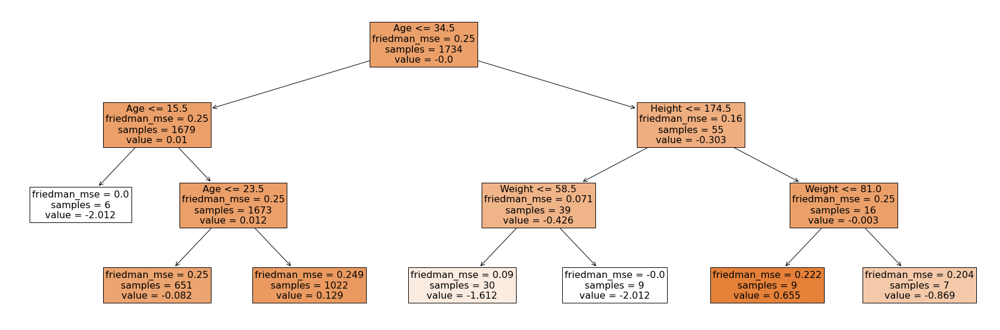

In [ ]:
plt.rcParams['figure.figsize'] = (30, 10)
tree.plot_tree(
    clf_gb_female.estimators_[0, 0],
    fontsize=16,
    feature_names=dataset_Female_Athletics.drop(labels=['Medal'], axis=1).columns.to_list(),
    class_names='Medal',
    filled=True
)

# XGBoost Classifier

In [ ]:
# Importando a biblioteca que contem o classificador
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

In [ ]:
#Setando os hiperparâmetros para rodar na grid
hyperparmameters_xgb = {
    "learning_rate": [ 0.1, 0.5, 1],
    "max_depth":[3,5,8],
    "max_features":["log2","sqrt"],
    #"criterion": ["friedman_mse",  "mae"],
    "n_estimators":[5,10,15]
}

grid_search_xgb = GridSearchCV(xgb.XGBClassifier(),
                              param_grid = hyperparmameters_xgb,
                              cv=10,
                              n_jobs= -1)

grid_search_xgb.fit(X_train_female, y_train_female)

Y_female_gb = grid_search_xgb.predict(X_test_female)


In [ ]:
print('Grid Search selected parameters: {}'.format(grid_search_xgb.best_params_))

Grid Search selected parameters: {'learning_rate': 0.1, 'max_depth': 3, 'max_features': 'log2', 'n_estimators': 5}


In [ ]:
from numpy.ma.core import log2
# Criando uma instancia do classificador

# Declaração utilizando todos os parâmetros com valores padrões (default)
# clf_xgb_female = xgb.XGBClassifier()

# Declaração passando todos os possíveis parâmetros
clf_xgb_female = xgb.XGBClassifier(
    max_depth=3, learning_rate=0.5, n_estimators=15, max_features=log2
)

# Realizar o treinamento do modelo utilizando as bases de treinamento
clf_xgb_female.fit(X_train_female, y_train_female)

print('XGBClassifier treinado com sucesso')

print('Realizando a classificação');

# O método 'predict' fará a predição/classificação utilizando o modelo já treinado
# Para realizar a predição/classificação, passaremos a base de teste
y_pred_xbg_female = clf_xgb_female.predict(X_test_female)

print('Classificações realizadas com sucesso')

XGBClassifier treinado com sucesso
Realizando a classificação
Classificações realizadas com sucesso


In [ ]:
y_test_female = y_test_female.astype(int)

### Imprimindo resultados

Acurácia: 0.5604838709677419

Relatório da classificação:
              precision    recall  f1-score   support

           0       0.57      0.56      0.56       377
           1       0.55      0.56      0.56       367

    accuracy                           0.56       744
   macro avg       0.56      0.56      0.56       744
weighted avg       0.56      0.56      0.56       744


Matriz de confusão:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


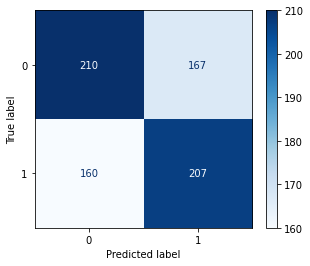

In [ ]:
print(f'Acurácia: {accuracy_score(y_test_female, y_pred_xbg_female)}\n')

print('Relatório da classificação:')
print(classification_report(y_test_female,y_pred_xbg_female))

print('\nMatriz de confusão:')

plt.rcParams['figure.figsize'] = (5, 4)
plot_confusion_matrix(clf_xgb_female, X_test_female, y_test_female, cmap='Blues')

### Plotando árvore

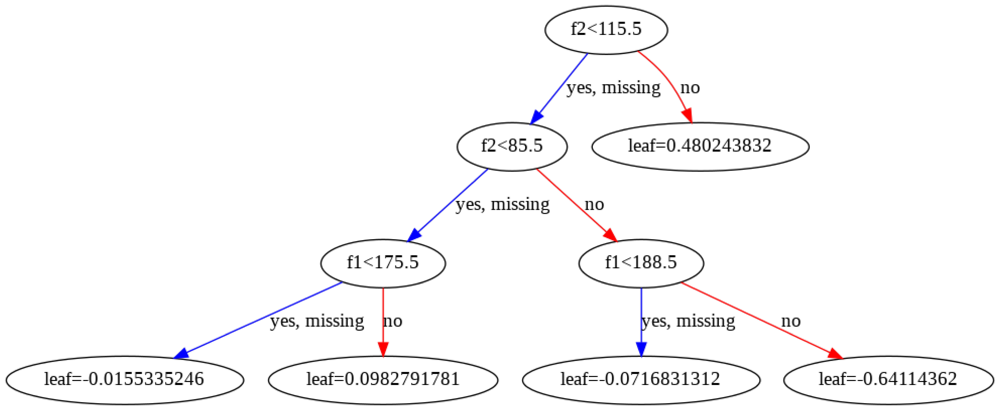

In [ ]:
plt.rcParams['figure.figsize'] = (160, 70)
xgb.plot_tree(clf_xgb_female, num_trees=4)